In [1]:
# Module to get variable name as str
!pip3 install varname

In [2]:
# Install kaggle to download dataset
! pip install kaggle

In [3]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
# Reload TensorBoard
# %reload_ext tensorboard

In [14]:
from datetime import datetime as dt
from varname import argname
import os

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, RobustScaler
from sklearn.model_selection import train_test_split
from google.colab import drive
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import sklearn
import zipfile

# Load data

In [5]:
# Mount Google Drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
# Create a new directory in root
! mkdir ~/.kaggle

# Copy kaggle API token from Google Drive to the created directory
# To get API token: Login to Kaggle -> Account -> API -> Create New API Token (-> save in Google Drive for easier access)
!cp /content/drive/MyDrive/mida_deep_learning/kaggle.json ~/.kaggle/kaggle.json

# Download dataset from kaggle
!kaggle datasets download -d shivam2503/diamonds

  0% 0.00/733k [00:00<?, ?B/s]
100% 733k/733k [00:00<00:00, 99.9MB/s]


In [7]:
# Extract dataset from zip to current session
zip_ref = zipfile.ZipFile('/content/diamonds.zip', 'r') # Opens the zip file in read mode
zip_ref.extractall('/content')
zip_ref.close()

In [17]:
df = pd.read_csv('/content/diamonds.csv', index_col=0)

In [13]:
df

,carat,cut,color,clarity,depth,table,price,x,y,z
1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53936,0.72,Ideal,D,SI1,60.8,57.0,2757,5.75,5.76,3.50
53937,0.72,Good,D,SI1,63.1,55.0,2757,5.69,5.75,3.61
53938,0.70,Very Good,D,SI1,62.8,60.0,2757,5.66,5.68,3.56
53939,0.86,Premium,H,SI2,61.0,58.0,2757,6.15,6.12,3.74


# Preprocess data

In [12]:
# Check for NAs and Nulls
print(df.isna().sum())
print(df.isnull().sum())

carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64
carat      0
cut        0
color      0
clarity    0
depth      0
table      0
price      0
x          0
y          0
z          0
dtype: int64


In [46]:
# Transform all categorical columns

transformer = ColumnTransformer(
    transformers=[('ord_cut', OrdinalEncoder(), ['cut']),
                  ('ord_color', OrdinalEncoder(), ['color']),
                  ('ord_clarity', OrdinalEncoder(), ['clarity'])],
                  remainder="passthrough")

transformed = transformer.fit_transform(df)

In [49]:
transformed.shape

(53940, 10)

In [54]:
# Convert numpy array into dataframe and reset into the original column names
df2 = pd.DataFrame(transformed).set_axis(df.columns, axis=1)

In [55]:
df2

,carat,cut,color,clarity,depth,table,price,x,y,z
0,2.0,1.0,3.0,0.23,61.5,55.0,326.0,3.95,3.98,2.43
1,3.0,1.0,2.0,0.21,59.8,61.0,326.0,3.89,3.84,2.31
2,1.0,1.0,4.0,0.23,56.9,65.0,327.0,4.05,4.07,2.31
3,3.0,5.0,5.0,0.29,62.4,58.0,334.0,4.20,4.23,2.63
4,1.0,6.0,3.0,0.31,63.3,58.0,335.0,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,2.0,0.0,2.0,0.72,60.8,57.0,2757.0,5.75,5.76,3.50
53936,1.0,0.0,2.0,0.72,63.1,55.0,2757.0,5.69,5.75,3.61
53937,4.0,0.0,2.0,0.70,62.8,60.0,2757.0,5.66,5.68,3.56
53938,3.0,4.0,3.0,0.86,61.0,58.0,2757.0,6.15,6.12,3.74


In [58]:
# Split into feature and label
features = df2.drop(columns=['price'])
label = df2[['price']]

# Train/ test split
X_train, X_test, y_train, y_test = train_test_split(features, label, test_size=0.2, random_state=0)

In [59]:
print('length of Train set:', len(X_train))
print('length of Test set:', len(X_test))

length of Train set: 43152
length of Test set: 10788


In [60]:
# Scale data
scaler = RobustScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build model

In [106]:
model = tf.keras.Sequential([
                              tf.keras.Input(shape=(X_train_scaled.shape[-1],)),
                              tf.keras.layers.Dense(512, activation='relu'),
                              tf.keras.layers.Dense(256, activation='relu'),
                              tf.keras.layers.Dense(128, activation='relu'),
                              tf.keras.layers.Dense(64, activation='relu'),
                              tf.keras.layers.Dense(32, activation='relu'),
                              tf.keras.layers.Dense(1, activation='linear')
])

In [107]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               5120      
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dense_3 (Dense)             (None, 64)                8256      
                                                                 
 dense_4 (Dense)             (None, 32)                2080      
                                                                 
 dense_5 (Dense)             (None, 1)                 33        
                                                                 
Total params: 179,713
Trainable params: 179,713
Non-trai

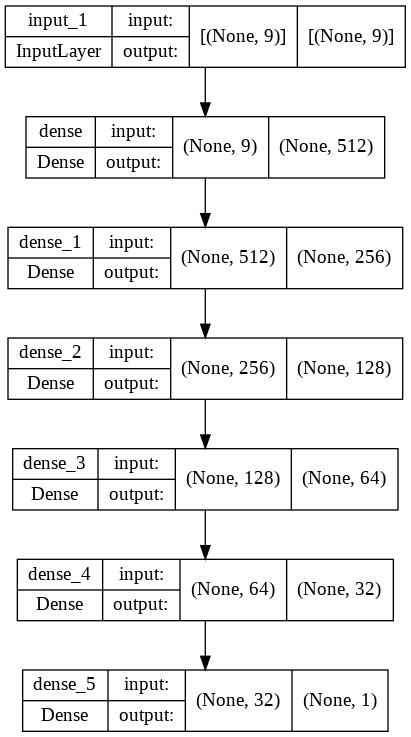

In [108]:
tf.keras.utils.plot_model(model, show_shapes=True)

In [104]:
def train_model(model, epochs=10):

  model.compile(optimizer='adam',
                loss='mean_absolute_error',
                metrics=['mean_absolute_error'])
  
  # Initialize checkpoint
  filepath="weights-improvement-{epoch:02d}-{mean_absolute_error:.2f}.hdf5"
  checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath, monitor='mean_absolute_error', verbose=1, save_best_only=True, mode='min')

  # Initialize tensorboard
  logdir = os.path.join("logs", argname('model'))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

  return model.fit(X_train_scaled, y_train, validation_data=(X_test_scaled, y_test), epochs=epochs, callbacks=[checkpoint, tensorboard_callback])

In [109]:
history = train_model(model, 100)

Epoch 1/100
1349/1349 [==============================] - ETA: 0s - loss: 774.4876 - mean_absolute_error: 774.4876
Epoch 1: mean_absolute_error improved from inf to 774.48761, saving model to weights-improvement-01-774.49.hdf5
1349/1349 [==============================] - 7s 5ms/step - loss: 774.4876 - mean_absolute_error: 774.4876 - val_loss: 558.7953 - val_mean_absolute_error: 558.7953
Epoch 2/100
1341/1349 [============================>.] - ETA: 0s - loss: 537.1193 - mean_absolute_error: 537.1193
Epoch 2: mean_absolute_error improved from 774.48761 to 536.93732, saving model to weights-improvement-02-536.94.hdf5
1349/1349 [==============================] - 6s 5ms/step - loss: 536.9373 - mean_absolute_error: 536.9373 - val_loss: 509.0951 - val_mean_absolute_error: 509.0951
Epoch 3/100
1345/1349 [============================>.] - ETA: 0s - loss: 509.6210 - mean_absolute_error: 509.6210
Epoch 3: mean_absolute_error improved from 536.93732 to 509.52539, saving model to weights-improvement

In [105]:
tf.keras.backend.clear_session()

In [95]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

# Deploy model

In [129]:
# Get prediction on test set
y_pred = model.predict(X_test_scaled)

# Print the predicted value and actual value for first 20 rows
for pred, act in zip(y_pred[:20], np.array(y_test[:20])):
  print(f"{'Predicted: ' + str(int(pred[0])):<20} Actual: {int(act[0])}")

Predicted: 4876      Actual: 4733
Predicted: 7089      Actual: 6424
Predicted: 5330      Actual: 5510
Predicted: 11272     Actual: 8770
Predicted: 4614      Actual: 4493
Predicted: 919       Actual: 918
Predicted: 758       Actual: 789
Predicted: 3049      Actual: 2823
Predicted: 15377     Actual: 18705
Predicted: 491       Actual: 507
Predicted: 1641      Actual: 1880
Predicted: 915       Actual: 935
Predicted: 1848      Actual: 1872
Predicted: 947       Actual: 956
Predicted: 3822      Actual: 3111
Predicted: 14486     Actual: 16499
Predicted: 937       Actual: 954
Predicted: 8857      Actual: 8342
Predicted: 7250      Actual: 8711
Predicted: 2424      Actual: 2567


In [110]:
%%shell
jupyter nbconvert --to html /content/diamond_price_prediction.ipynb

[NbConvertApp] Converting notebook /content/diamond_price_prediction.ipynb to html
[NbConvertApp] Writing 410848 bytes to /content/diamond_price_prediction.html
